In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from imblearn.over_sampling import SMOTE

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [74]:
data = pd.read_csv('data/weatherAUS.csv')

# Data Exploration

In [75]:
data.head() 

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


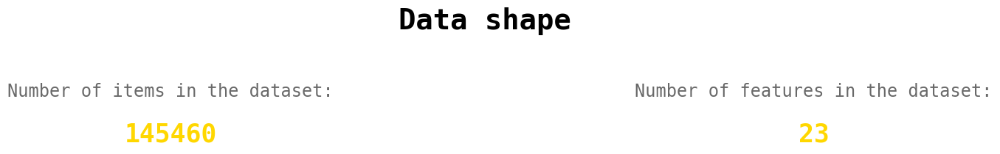

In [76]:
# inspiration code: https://www.kaggle.com/dwin183287/covid-19-world-vaccination
fig=plt.figure(figsize=(5,2),facecolor='white')

ax0=fig.add_subplot(1,1,1)
ax0.text(1.1,1,"Data shape",color='black',fontsize=28, fontweight='bold', fontfamily='monospace',ha='center')

ax0.text(0,0.001,data.shape[0],color='gold',fontsize=25, fontweight='bold', fontfamily='monospace',ha='center')
ax0.text(0,0.4,"Number of items in the dataset:",color='dimgrey',fontsize=17, fontweight='light', fontfamily='monospace',ha='center')

ax0.text(2.25,0.001,data.shape[1],color='gold',fontsize=25, fontweight='bold', fontfamily='monospace',ha='center')
ax0.text(2.25,0.4,"Number of features in the dataset:",color='dimgrey',fontsize=17, fontweight='light', fontfamily='monospace',ha='center')

ax0.set_yticklabels('')
ax0.tick_params(axis='y',length=0)
ax0.tick_params(axis='x',length=0)
ax0.set_xticklabels('')

for direction in ['top','right','left','bottom']:
    ax0.spines[direction].set_visible(False)

In [77]:
data.info() #data information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

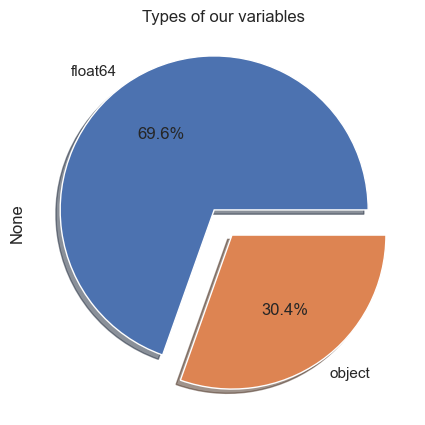

In [83]:
fig, ax = plt.subplots(figsize=(8, 5))
data.dtypes.value_counts().plot.pie(explode=[0.1, 0.1], autopct='%1.1f%%', shadow=True, ax=ax);
ax.set_title("Types of our variables", fontsize=12)
plt.show()

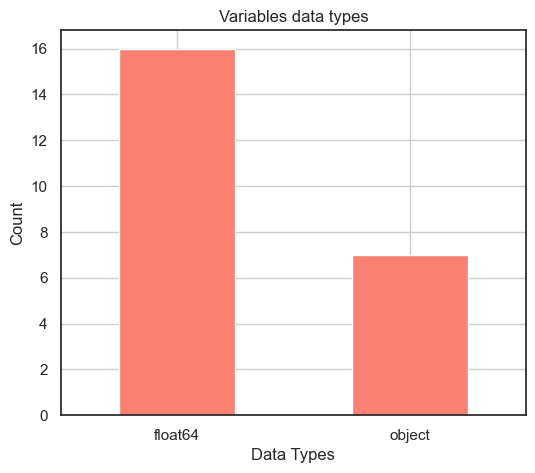

In [91]:
dtype_counts = data.dtypes.value_counts()

plt.figure(figsize=(6, 5))
dtype_counts.plot(kind='bar', color='salmon')
plt.title('Variables data types')
plt.xlabel('Data Types')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(True)  
plt.show()


**Let's take analyze target variable "RainTomorrow"**. 

The first thing we can notice is that the target variable contains some null values. To handle this, we'll impute the missing values using mode simply because we're in a binary calssificaion and using mean will generate a float variable.

In [118]:
mode_value = data['RainTomorrow'].mode()[0]
data['RainTomorrow'] = data['RainTomorrow'].fillna(mode_value)

In [120]:
if data['RainTomorrow'].isna().sum() == 0:
    print('NOO MORE MISSING VALUES IN THE TARGET COLUMN! :)')

NOO MORE MISSING VALUES IN THE TARGET COLUMN! :)


Now let's evaluate our classes

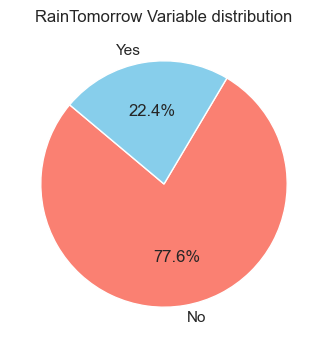

In [97]:
fig = plt.figure(figsize=(5, 4))
data['RainTomorrow'].value_counts(normalize=True).plot.pie(colors=['salmon', 'skyblue'], autopct='%1.1f%%', startangle=140)
plt.title('RainTomorrow Variable distribution')
plt.ylabel('')  
plt.show()

Out of the total number of RainTomorrow values, **'No' appears 77.58% times and 'Yes' appears 22.42% times**. This means that we have to deal with a **class imbalance** in our dataset.
For this we've decided to use **Synthetic Minority Oversampling Technique (SMOTE)** to generate synthetic data for the minority class

SMOTE works by randomly picking a point from the minority class and computing the k-nearest neighbors for this point. The synthetic points are added between the chosen point and its neighbors. It works in 4 simple steps:

- Choose a minority class as the input vector.
- Find its k nearest neighbors (k_neighbors is specified as an argument in the SMOTE() function).
- Choose one of these neighbors and place a synthetic point anywhere on the line joining the point under consideration and its chosen neighbor.
- Repeat the steps until the data is balanced.

NOTE:

Before applying SMOTE for oversampling, it's important to perform some preprocessing steps to prepare the data ( Handle Missing values - Encode categorical variables - Normalization or Standardization - Split data to train and test)

Before that let's transform our target variable to a numerical variable. **Yes --> 1 and No --> 0**. And we'll do it for both **'RainToday' and 'RainTomorrow'** variables to keep our data consistent.

In [121]:
data['RainToday'].replace({'No': 0, 'Yes': 1},inplace = True)
data['RainTomorrow'].replace({'No': 0, 'Yes': 1},inplace = True)

We will create a representative table of our missing data

In [122]:
# create a table with missing data 
missing_values=data.isnull().sum() 

missing_percentage = data.isnull().sum()/df.shape[0]*100

value = {
    'missing_values':missing_values,
    'missing_percent %':missing_percentage , 
     'data type' : data.dtypes
}
missing=pd.DataFrame(value)
missing = missing.sort_values(by='missing_values', ascending=False)

missing

,missing_values,missing_percent %,data type
Sunshine,69835,48.009762,float64
Evaporation,62790,43.166506,float64
Cloud3pm,59358,40.807095,float64
Cloud9am,55888,38.421559,float64
Pressure9am,15065,10.356799,float64
Pressure3pm,15028,10.331363,float64
WindDir9am,10566,7.263853,object
WindGustDir,10326,7.098859,object
WindGustSpeed,10263,7.055548,float64
Humidity3pm,4507,3.098446,float64


In [123]:
smote = SMOTE()

x = data.drop(columns = ['RainTomorrow'])
y = data['RainTomorrow']

# fit predictor and target variable
x_smote, y_smote = smote.fit_resample(x, y)

print('Original dataset shape', Counter(y))
print('Resample dataset shape', Counter(y_smote))

ValueError: could not convert string to float: '2008-12-01'

In [31]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


**Before any further data cleaning and preprocessing, we gonna start by some vizualisations to understand the distribution of our data**

# Bivariate Analysis between continuous variables

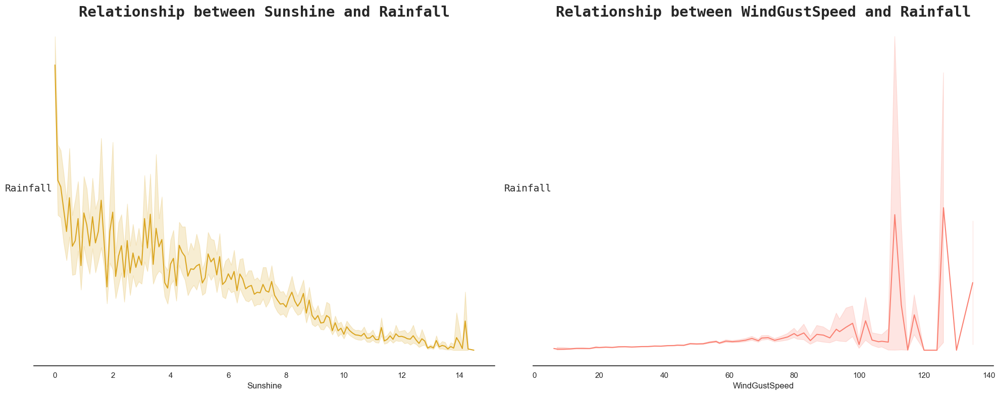

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8), facecolor='white')

titles = ["Relationship between Sunshine and Rainfall", "Relationship between WindGustSpeed and Rainfall"]
x_labels = ['Sunshine', 'WindGustSpeed']

for ax, title, x_label in zip(axes, titles, x_labels):
    ax.set_title(title, fontsize=21, fontweight='bold', fontfamily='monospace')
    sns.lineplot(data=data, x=x_label, y='Rainfall', ax=ax, color='goldenrod' if x_label == 'Sunshine' else 'salmon')
    ax.set_ylabel('Rainfall', rotation=0, fontsize=14, fontfamily='monospace')
    ax.set_yticklabels('')
    ax.tick_params(axis='y', length=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.tight_layout()
plt.show()


**We can see that tha rainfall decreases when there's sunshine during the day. While we can see that there's no observable relationship between the wind speed and the rainfall. We can confirm this laast observation by plotting the relationship between WindSpeed at 9 am and 3 pm and the Rainfall.**

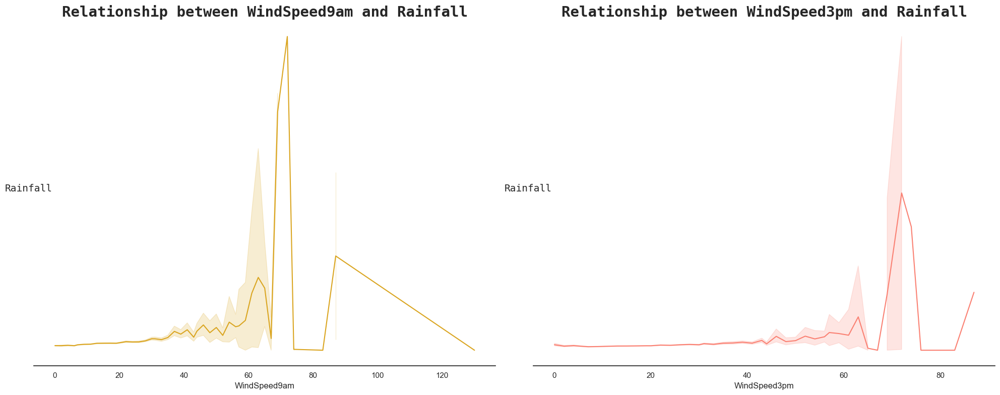

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8), facecolor='white')

titles = ["Relationship between WindSpeed9am and Rainfall", "Relationship between WindSpeed3pm and Rainfall"]
x_labels = ['WindSpeed9am', 'WindSpeed3pm']

for ax, title, x_label in zip(axes, titles, x_labels):
    ax.set_title(title, fontsize=21, fontweight='bold', fontfamily='monospace')
    sns.lineplot(data=data, x=x_label, y='Rainfall', ax=ax, color='goldenrod' if x_label == 'WindSpeed9am' else 'salmon')
    ax.set_ylabel('Rainfall', rotation=0, fontsize=14, fontfamily='monospace')
    ax.set_yticklabels('')
    ax.tick_params(axis='y', length=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.tight_layout()
plt.show()



In [49]:
fig = px.scatter(data, x="WindSpeed9am", y="WindSpeed3pm", color="Rainfall", title="Relationship between WindSpeed9am, WindSpeed3pm, and Rainfall")
fig.update_layout(width=800, height=600)
fig.show()

**We can comfirm by the two above figure that there's no remarkable relationship between the wind speed and the rainfall**

In [50]:
fig = px.scatter(data, x="MinTemp", y="MaxTemp", color="Rainfall", title="Relationship between MinTemp, MaxTemp, and Rainfall")
fig.update_layout(width=800, height=600)
fig.show()

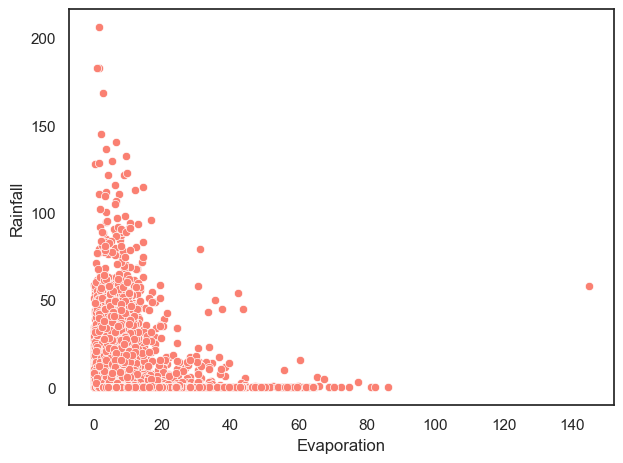

In [37]:
sns.scatterplot(data=data,x='Evaporation',y='Rainfall',color='salmon')
plt.tight_layout()
plt.show()

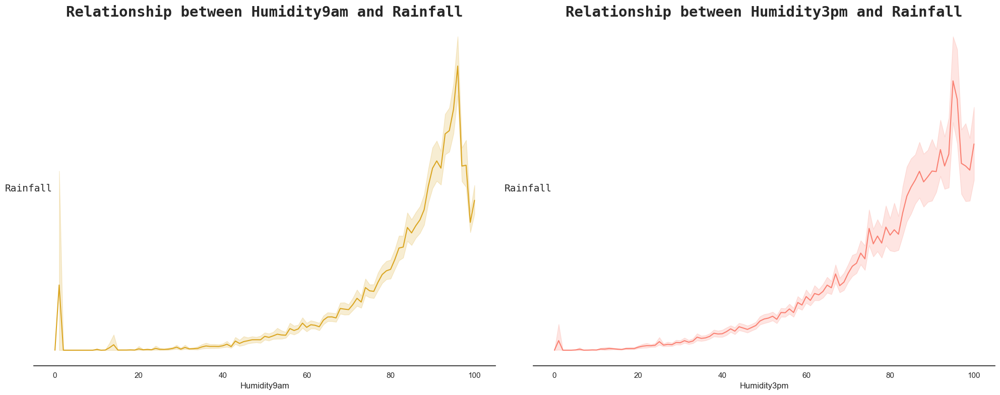

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8), facecolor='white')

titles = ["Relationship between Humidity9am and Rainfall", "Relationship between Humidity3pm and Rainfall"]
x_labels = ['Humidity9am', 'Humidity3pm']

for ax, title, x_label in zip(axes, titles, x_labels):
    ax.set_title(title, fontsize=21, fontweight='bold', fontfamily='monospace')
    sns.lineplot(data=data, x=x_label, y='Rainfall', ax=ax, color='goldenrod' if x_label == 'Humidity9am' else 'salmon')
    ax.set_ylabel('Rainfall', rotation=0, fontsize=14, fontfamily='monospace')
    ax.set_yticklabels('')
    ax.tick_params(axis='y', length=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.tight_layout()
plt.show()


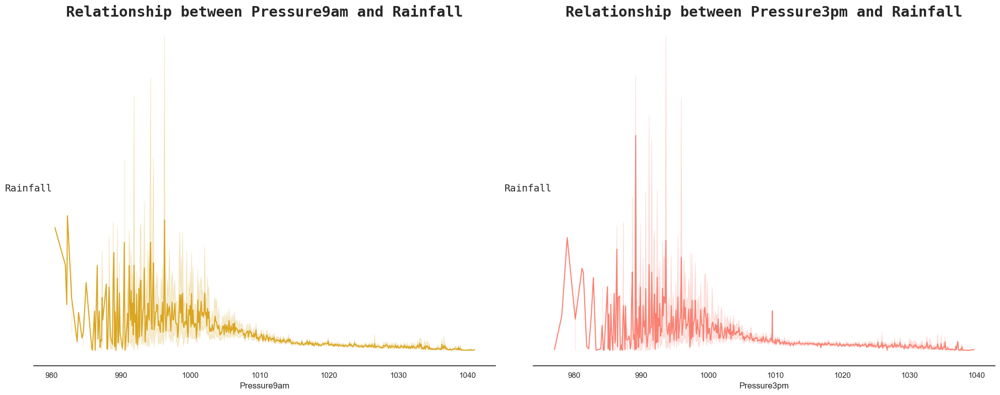

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8), facecolor='white')

titles = ["Relationship between Pressure9am and Rainfall", "Relationship between Pressure3pm and Rainfall"]
x_labels = ['Pressure9am', 'Pressure3pm']

for ax, title, x_label in zip(axes, titles, x_labels):
    ax.set_title(title, fontsize=21, fontweight='bold', fontfamily='monospace')
    sns.lineplot(data=data, x=x_label, y='Rainfall', ax=ax, color='goldenrod' if x_label == 'Pressure9am' else 'salmon')
    ax.set_ylabel('Rainfall', rotation=0, fontsize=14, fontfamily='monospace')
    ax.set_yticklabels('')
    ax.tick_params(axis='y', length=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.tight_layout()
plt.show()


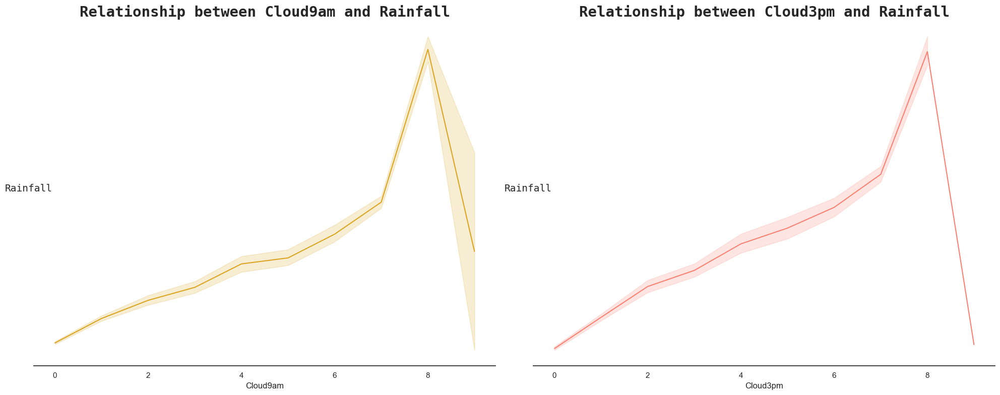

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8), facecolor='white')

titles = ["Relationship between Cloud9am and Rainfall", "Relationship between Cloud3pm and Rainfall"]
x_labels = ['Cloud9am', 'Cloud3pm']

for ax, title, x_label in zip(axes, titles, x_labels):
    ax.set_title(title, fontsize=21, fontweight='bold', fontfamily='monospace')
    sns.lineplot(data=data, x=x_label, y='Rainfall', ax=ax, color='goldenrod' if x_label == 'Cloud9am' else 'salmon')
    ax.set_ylabel('Rainfall', rotation=0, fontsize=14, fontfamily='monospace')
    ax.set_yticklabels('')
    ax.tick_params(axis='y', length=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.tight_layout()
plt.show()


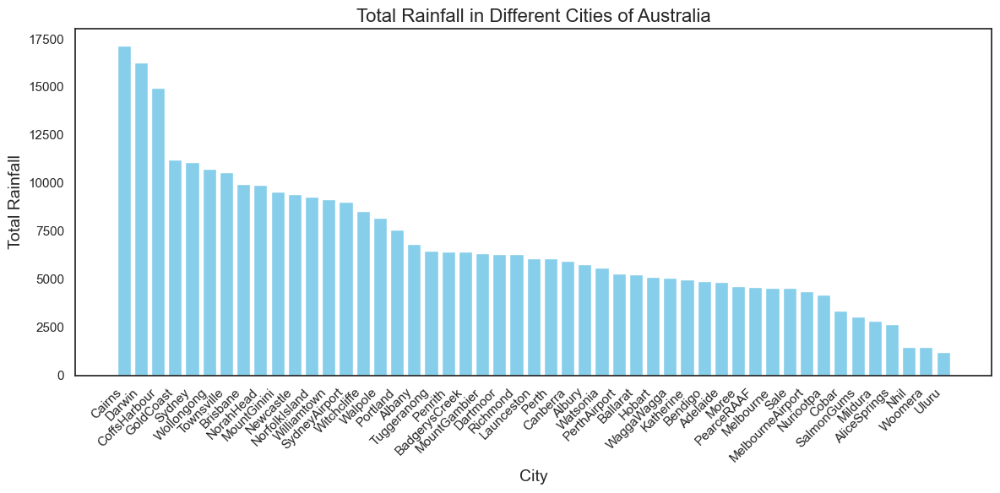

In [42]:
city_rainfall_totals = data.groupby('Location')['Rainfall'].sum().reset_index()

city_rainfall_totals = city_rainfall_totals.sort_values(by='Rainfall', ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(city_rainfall_totals['Location'], city_rainfall_totals['Rainfall'], color='skyblue')

# Add labels and title
plt.xlabel('City', fontsize=14)
plt.ylabel('Total Rainfall', fontsize=14)
plt.title('Total Rainfall in Different Cities of Australia', fontsize=16)
plt.xticks(rotation=45, ha='right')  
# Show the plot
plt.tight_layout()
plt.show()

In [44]:
df = data.copy()
df['Date'] = pd.to_datetime(df['Date'])  # Convert the date column to datetime format

df['month'] = df['Date'].dt.month

unique_months = df['month'].nunique()

print("Number of unique months:", unique_months)


Number of unique months: 12


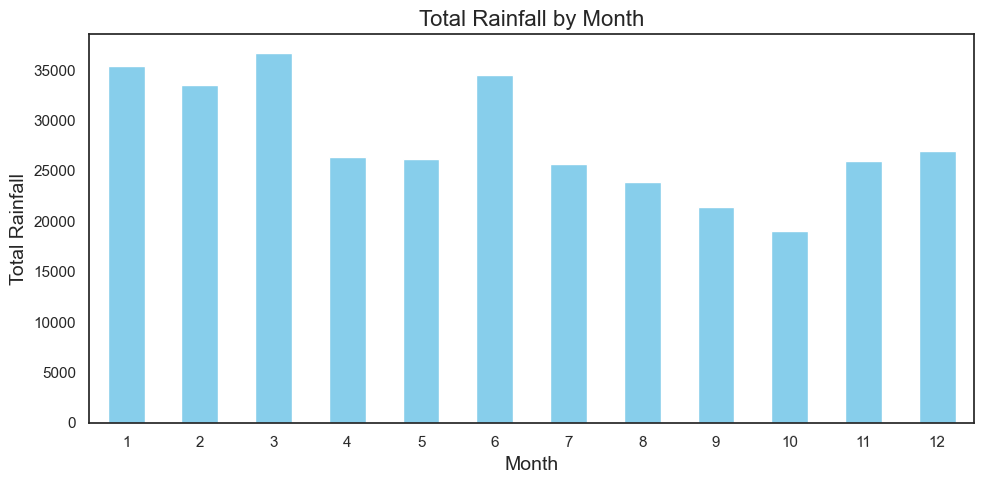

In [47]:
monthly_rainfall = df.groupby('month')['Rainfall'].sum()

plt.figure(figsize=(10, 5))
monthly_rainfall.plot(kind='bar', color='skyblue')

plt.xlabel('Month', fontsize=14)
plt.ylabel('Total Rainfall', fontsize=14)
plt.title('Total Rainfall by Month', fontsize=16)
plt.xticks(rotation=1) 

plt.tight_layout()
plt.show()

## Data preprocessing

In [48]:
data.isna().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [54]:
numeric_variables = [col for col in df.columns if df[col].dtype == 'float64']

print("Variables with float64 data type:", numeric_variables)


Variables with float64 data type: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


(array([1, 2, 3, 4]),
 [Text(1, 0, 'MinTemp'),
  Text(2, 0, 'MaxTemp'),
  Text(3, 0, 'Temp9am'),
  Text(4, 0, 'Temp3pm')])

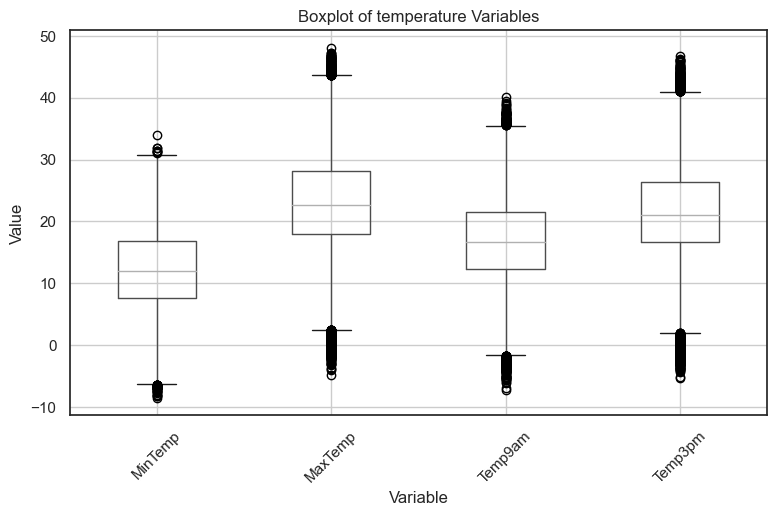

In [68]:

df = pd.DataFrame(data, columns=['MinTemp', 'MaxTemp','Temp9am', 'Temp3pm'])

# Plot boxplots for each column
plt.figure(figsize=(9,5))
df.boxplot(grid=True)
plt.title('Boxplot of temperature Variables')
plt.xlabel('Variable')
plt.ylabel('Value')
plt.xticks(rotation=45)  


(array([1, 2, 3]),
 [Text(1, 0, 'WindGustSpeed'),
  Text(2, 0, 'WindSpeed9am'),
  Text(3, 0, 'WindSpeed3pm')])

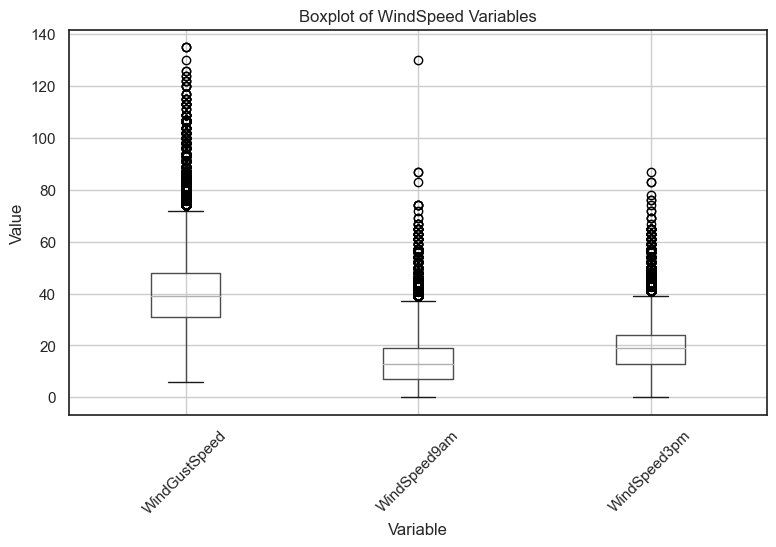

In [67]:

df = pd.DataFrame(data, columns=['WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm'])

# Plot boxplots for each column
plt.figure(figsize=(9,5))
df.boxplot(grid=True)
plt.title('Boxplot of WindSpeed Variables')
plt.xlabel('Variable')
plt.ylabel('Value')
plt.xticks(rotation=45)  


(array([1, 2]), [Text(1, 0, 'Humidity9am'), Text(2, 0, 'Humidity3pm')])

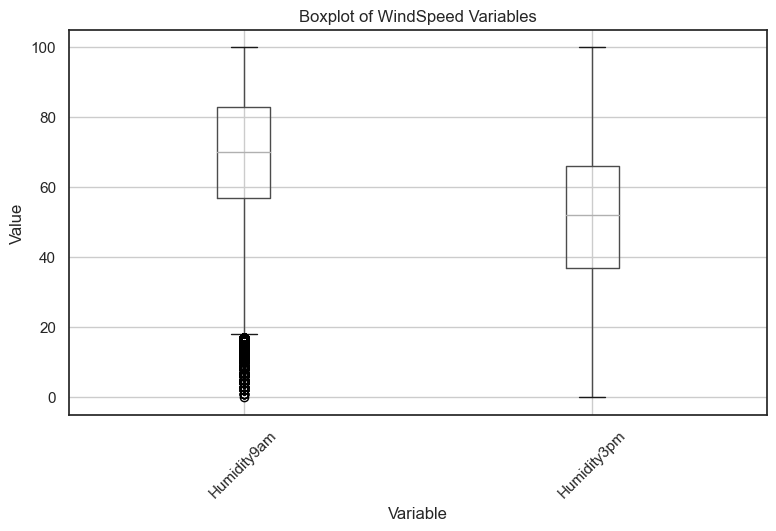

In [69]:

df = pd.DataFrame(data, columns=['Humidity9am', 'Humidity3pm'])

# Plot boxplots for each column
plt.figure(figsize=(9,5))
df.boxplot(grid=True)
plt.title('Boxplot of Humidity Variables')
plt.xlabel('Variable')
plt.ylabel('Value')
plt.xticks(rotation=45)  


(array([1, 2]), [Text(1, 0, 'Pressure9am'), Text(2, 0, 'Pressure3pm')])

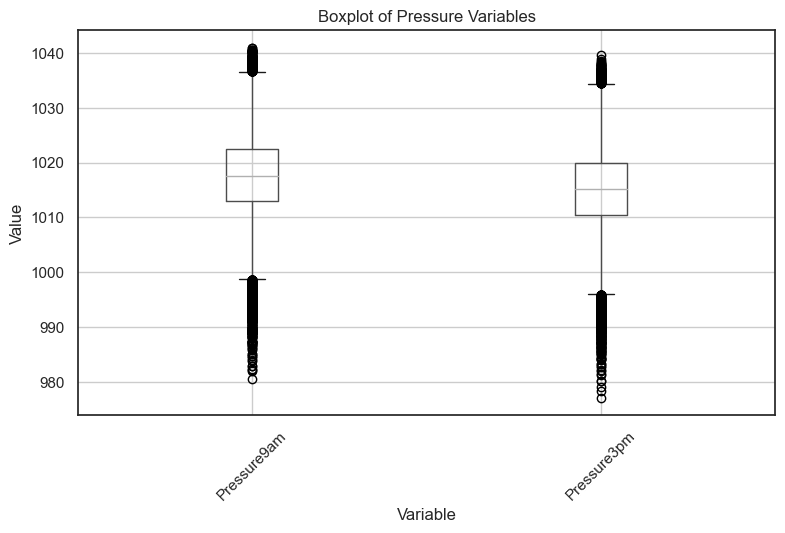

In [71]:

df = pd.DataFrame(data, columns=['Pressure9am', 'Pressure3pm'])

# Plot boxplots for each column
plt.figure(figsize=(9,5))
df.boxplot(grid=True)
plt.title('Boxplot of Pressure Variables')
plt.xlabel('Variable')
plt.ylabel('Value')
plt.xticks(rotation=45)  


(array([1, 2]), [Text(1, 0, 'Cloud9am'), Text(2, 0, 'Cloud3pm')])

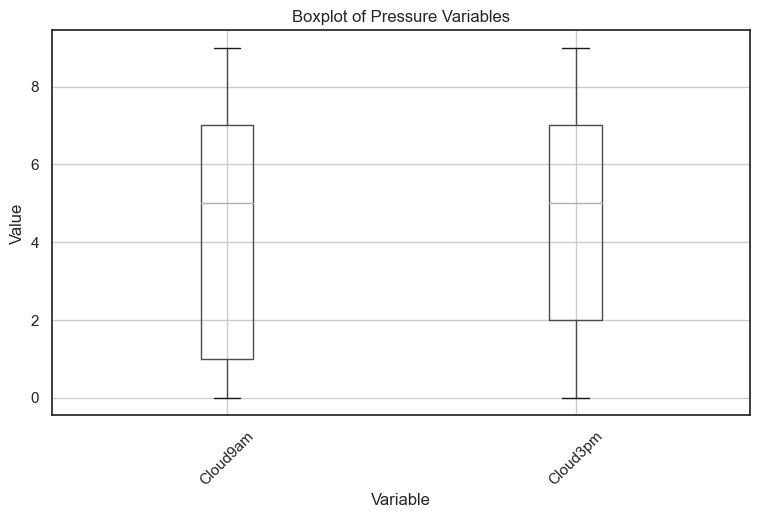

In [72]:
df = pd.DataFrame(data, columns=['Cloud9am', 'Cloud3pm'])

# Plot boxplots for each column
plt.figure(figsize=(9,5))
df.boxplot(grid=True)
plt.title('Boxplot of Pressure Variables')
plt.xlabel('Variable')
plt.ylabel('Value')
plt.xticks(rotation=45)  
